- 참고 블로그 
- https://jkisaaclee.kro.kr/keras/facenet/deep%20learning/computer%20vision/2019/10/01/how_to_develop_a_face_recognition_system_using_facenet_in_keras_ko/
- **미리 사전학습된 FaceNet model 받아두기**
- https://drive.google.com/drive/folders/1pwQ3H4aJ8a6yyJHZkTwtjcL4wYWQb7bn

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
pip install mtcnn

     |████████████████████████████████| 2.3 MB 4.2 MB/s 


In [3]:
pip install face_alignment

  Created wheel for face-alignment: filename=face_alignment-1.3.4-py2.py3-none-any.whl size=27862 sha256=203c5563de1297c35bbb064afd625be0d7e74b22f2590c02d47a53098ba96df5
  Stored in directory: /root/.cache/pip/wheels/73/f8/8f/617fca0e22aa1dc6b5fbfad78b07fa7626707b49167eea901c
Successfully built face-alignment


In [ ]:
ls

drive/  sample_data/


In [4]:
# MTCNN이 올바르게 설치되었는지 확인
import mtcnn
# 버전 출력
print(mtcnn.__version__)

0.1.0


### MTCNN 사용해서 Face Detection

In [5]:
import os
from PIL import Image
import matplotlib.pyplot as plt
from mtcnn.mtcnn import MTCNN
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans

In [6]:
# 주어진 사진에서 하나의 얼굴 추출
def extract_face(filename, required_size=(160, 160), save=False):
    print(filename)
    # 파일에서 이미지 불러오기
    image = Image.open(filename)
    # RGB로 변환, 필요시
    image = image.convert('RGB')
    # 배열로 변환
    pixels = np.asarray(image)
    # 감지기 생성, 기본 가중치 이용
    detector = MTCNN()
    # 이미지에서 얼굴 감지
    results = detector.detect_faces(pixels)
    # 첫 번째 얼굴에서 경계 상자 추출
    # detect_faces의 결과물 : box, cofidence, keypoints(left_eye, right_eye, nose, mouth_left, mouth_right)
    # 사진 크기가 너무 작아서 detect가 안되는 경우가 있음 -> 우선 그런 영상들을 제외하고 진행
    if len(results)==0:
        return np.asarray([])
    x1, y1, width, height = results[0]['box']
    # 버그 수정
    x1, y1 = abs(x1), abs(y1)
    x2, y2 = x1 + width, y1 + height
    # 얼굴 추출
    face = pixels[y1:y2, x1:x2]
    # 모델 사이즈로 픽셀 재조정
    # Image.fromarray() : 배열 객체를 입력으로 받아 배열 객체에서 만든 이미지 객체를 반환
    image = Image.fromarray(face)
    image = image.resize(required_size)
    # face data 저장
    if save == True:
        face_path = filename.split('/') #['drive','MyDrive','team_project','dataset','female','0000.jpg']
        jpg = face_path[-1].split('.')[0]+'.jpg'
        face_path[-1] = jpg
        face_path[-2] = face_path[-2]+'_face'
        face_path = os.path.join(*face_path)
        image.save(face_path)
    face_array = np.asarray(image)
    return face_array

In [7]:
# 디렉토리 안의 모든 이미지를 불러오고 이미지에서 얼굴 추출
def load_faces(directory):
    faces = list()
    # 얼굴이 아예 검출되지 않은 경우, filename 확인
    no_face = list()
    # 파일 열거
    for filename in sorted(os.listdir(directory)):
        # 경로
        path = directory + '/' + filename
        # 얼굴 추출
        face = extract_face(path,(160,160), True)
        # 얼굴 사진 따로 저장해서 확인하고 싶으면 save = True로 해서 돌리기
        # face = extract_face(path,(160,160),True)
        if len(face) == 0:
            no_face.append(filename)
        # 저장
        else:
            faces.append(face)
    # extrac_face할때, 얼굴이 검출되지 않은 경우 []을 리턴했기 때문에 제거하는 과정 
    faces = list(filter(lambda x: len(x)>0, faces))
    return faces, no_face

In [ ]:
# 검출된 얼굴 데이터를 array로 저장 -> 나중에 FaceNet이 이 파일 load해서 입력으로 쓸 수 있도록
path = './drive/MyDrive/team_project/dataset/'
gender = ['female', 'male']
for g in gender:
    faces, no_face = load_faces(path+g)
    print('검출되지 않은 image 파일 :', no_face)
    print('{} dataset에서 검출된 face 개수 : {}'.format(g, len(faces)))
    faces = np.asarray(faces)
    np.savez_compressed('./drive/MyDrive/team_project/npz/'+g+'_faces.npz',faces)

### FaceNet을 사용해서 Face Embedding

In [8]:
# 입력으로 들어온 model과 face data로 embedding 구하기
# 각 성별 전체 얼굴 데이터 모두 embedding으로 변환하여 반환
def get_embeddings(model, faces_data):
    embeddings = list()
    for face_pixels in faces_data:
        # 픽셀 값의 척도
        face_pixels = face_pixels.astype('int32')
        # 채널 간 픽셀값 표준화(전역에 걸쳐)
        mean, std = face_pixels.mean(), face_pixels.std()
        face_pixels = (face_pixels - mean) / std
        samples = np.expand_dims(face_pixels, axis=0)
        # 임베딩을 갖기 위한 예측 생성
        embedding = model.predict(samples)
        embeddings.append(embedding[0])
    embeddings = np.asarray(embeddings)
    return embeddings

In [9]:
# Warning 뜨는데 사실 아직 안 찾아봤어요... 

from keras.models import load_model

# facenet 모델 불러오기
model = load_model(filepath='./drive/MyDrive/team_project/model/facenet_keras.h5')
print(model.inputs)
# 얼굴 데이터 불러오기
female_data = np.load('./drive/MyDrive/team_project/npz/female_faces.npz')['arr_0']
# embedding 받아오기
female_embeddings = get_embeddings(model,female_data)
print(female_embeddings.shape)

'''
male_data = np.load('./drive/MyDrive/team_project/dataset/male_faces.npz')['arr_0']
male_embeddings = get_embeddings(model,male_data)
print(male_embeddings.shape)
'''

[<KerasTensor: shape=(None, 160, 160, 3) dtype=float32 (created by layer 'input_1')>]
(615, 128)


"\nmale_data = np.load('./drive/MyDrive/team_project/dataset/male_faces.npz')['arr_0']\nmale_embeddings = get_embeddings(model,male_data)\nprint(male_embeddings.shape)\n"

### 구한 Embedding을 기반으로 Clustering
- 현재 K-means Clustering 사용하고 있음
- 이후, 다른 clustering 알고리즘 사용해서 가장 성능 좋은 것을 선택하면 될 것 같다.

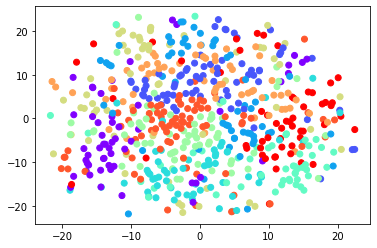

In [12]:
# cluster 개수 지정
n = 10
# k-means++ : 가지고 있는 데이터 포인트 중에서 무작위로 1개를 선택하여 그 녀석을 첫번째 중심점으로 지정
# 근데 사실 init = 'k-means++'라고 안해줘도 기본값으로 되어있다고 함 
kmeans = KMeans(init="k-means++", n_clusters=n, random_state=0)
# female으로 할지 male로 돌릴지 정해주기
kmeans.fit(female_embeddings)
y_pred = kmeans.labels_

tSNE(female_embeddings, y_pred)

def viz_img(y_pred, n=10):
    fig = plt.figure(figsize=(50,50))
    box_index = 1
    for cluster in range(n):
        result = np.where(y_pred == cluster)
        for i in np.random.choice(result[0].tolist(), n, replace=False):
            ax = fig.add_subplot(n, n, box_index)
            plt.imshow(female_data[i])
            plt.gray()
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)
            box_index += 1
    plt.show()
    
#viz_img(y_pred, n)

# tSNE 시각화 함수

In [11]:
def tSNE(arr, y_pred):
  model = TSNE(learning_rate=200)
  transformed = model.fit_transform(arr)

  xs = transformed[:,0]
  ys = transformed[:,1]
  plt.scatter(xs, ys, c=y_pred, cmap='rainbow')
  plt.show()

# 얼굴형, 눈썹, 눈, 코, 입, 전체 부위 좌표 도출

In [ ]:
def get_coord(directory):
  df = pd.DataFrame(columns=['face','eyebrow','eye','nose','lips','total'])

  face_detector = 'sfd'
  face_detector_kwargs = {
      "filter_threshold" : 0.8
  }

  fa = face_alignment.FaceAlignment(face_alignment.LandmarksType._2D, flip_input=True,
      face_detector=face_detector, face_detector_kwargs=face_detector_kwargs)
  
  files = sorted(os.listdir(directory))
  print(files)
  for file in files:
    preds = fa.get_landmarks(directory+'/'+file)[-1]

    face = np.array(preds[0:17]).flatten()
    eyebrow = np.array(preds[17:27]).flatten()
    nose = np.array(preds[27:31]).flatten()
    eye = np.array(preds[36:48]).flatten()
    lips = np.array(preds[48:60]).flatten()

    df.loc[len(df)]=[face, eyebrow, eye, nose, lips, preds.flatten()]

  return df


coord_df = get_coord('./drive/MyDrive/team_project/dataset/female_face')

['0000.jpg', '0001.jpg', '0002.jpg', '0003.jpg', '0004.jpg', '0005.jpg', '0006.jpg', '0007.jpg', '0008.jpg', '0009.jpg', '0010.jpg', '0011.jpg', '0012.jpg', '0013.jpg', '0014.jpg', '0015.jpg', '0016.jpg', '0017.jpg', '0018.jpg', '0019.jpg', '0020.jpg', '0022.jpg', '0023.jpg', '0024.jpg', '0025.jpg', '0026.jpg', '0027.jpg', '0028.jpg', '0029.jpg', '0030.jpg', '0031.jpg', '0032.jpg', '0033.jpg', '0034.jpg', '0035.jpg', '0036.jpg', '0037.jpg', '0038.jpg', '0039.jpg', '0040.jpg', '0041.jpg', '0042.jpg', '0043.jpg', '0044.jpg', '0045.jpg', '0046.jpg', '0047.jpg', '0048.jpg', '0049.jpg', '0050.jpg', '0051.jpg', '0052.jpg', '0053.jpg', '0054.jpg', '0055.jpg', '0056.jpg', '0057.jpg', '0058.jpg', '0059.jpg', '0060.jpg', '0061.jpg', '0062.jpg', '0063.jpg', '0064.jpg', '0065.jpg', '0066.jpg', '0067.jpg', '0068.jpg', '0069.jpg', '0070.jpg', '0071.jpg', '0072.jpg', '0073.jpg', '0074.jpg', '0075.jpg', '0076.jpg', '0077.jpg', '0078.jpg', '0079.jpg', '0080.jpg', '0081.jpg', '0082.jpg', '0083.jpg', '00

## 도출한 좌표값 스케일링

In [ ]:
def scale_coord(df):
  std_scaler = StandardScaler()
  scaled_df = df.copy()
  for i in scaled_df:
    part = scaled_df.loc[:, i]
    part_arr = []
    for j in part:
      part_arr.append(j)
    scaled_part = std_scaler.fit_transform(part_arr)
    for j in range(len(scaled_part)):
      scaled_df.loc[j,i]=scaled_part[j]
  return scaled_df

scaled_df = scale_coord(coord_df)

## 좌표값에 따른 Clustering

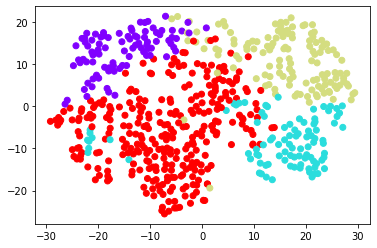

In [ ]:
pred_df = pd.DataFrame(columns=['face','eyebrow','eye','nose','lips','facealign'])

n=10
kmeans=KMeans(n_clusters=4, random_state=0)
kmeans.fit(scaled_df.loc[:,'total'].tolist())

y_pred = kmeans.labels_

for i in range(len(y_pred)):
  pred_df.loc[i,'facealign']=y_pred[i]

tSNE(scaled_df.loc[:,'total'].tolist(),y_pred)

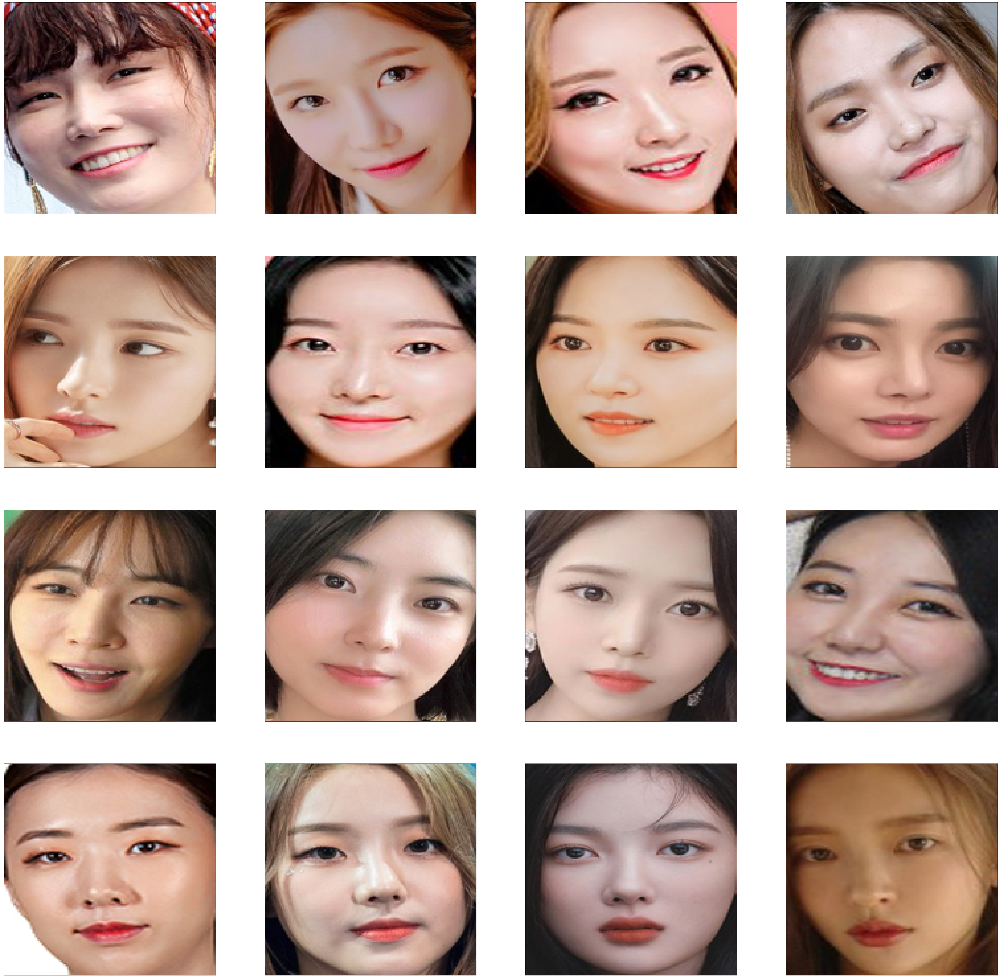

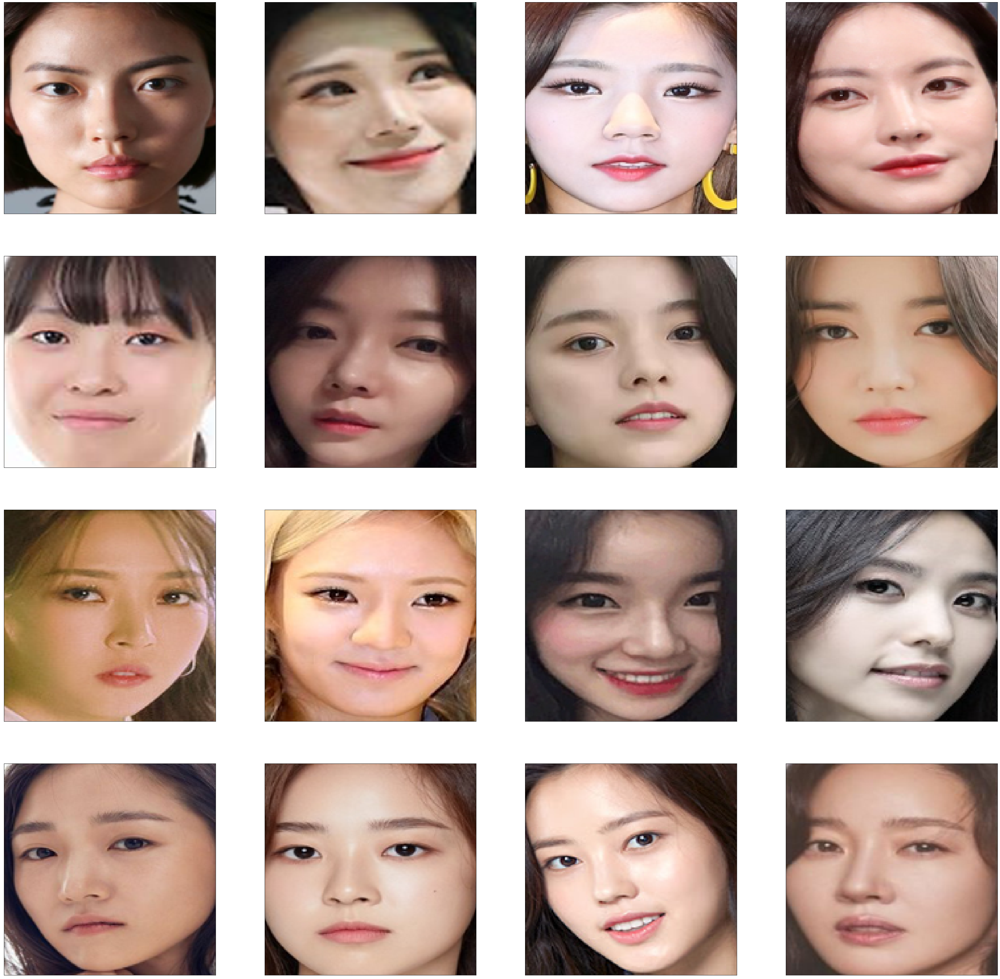

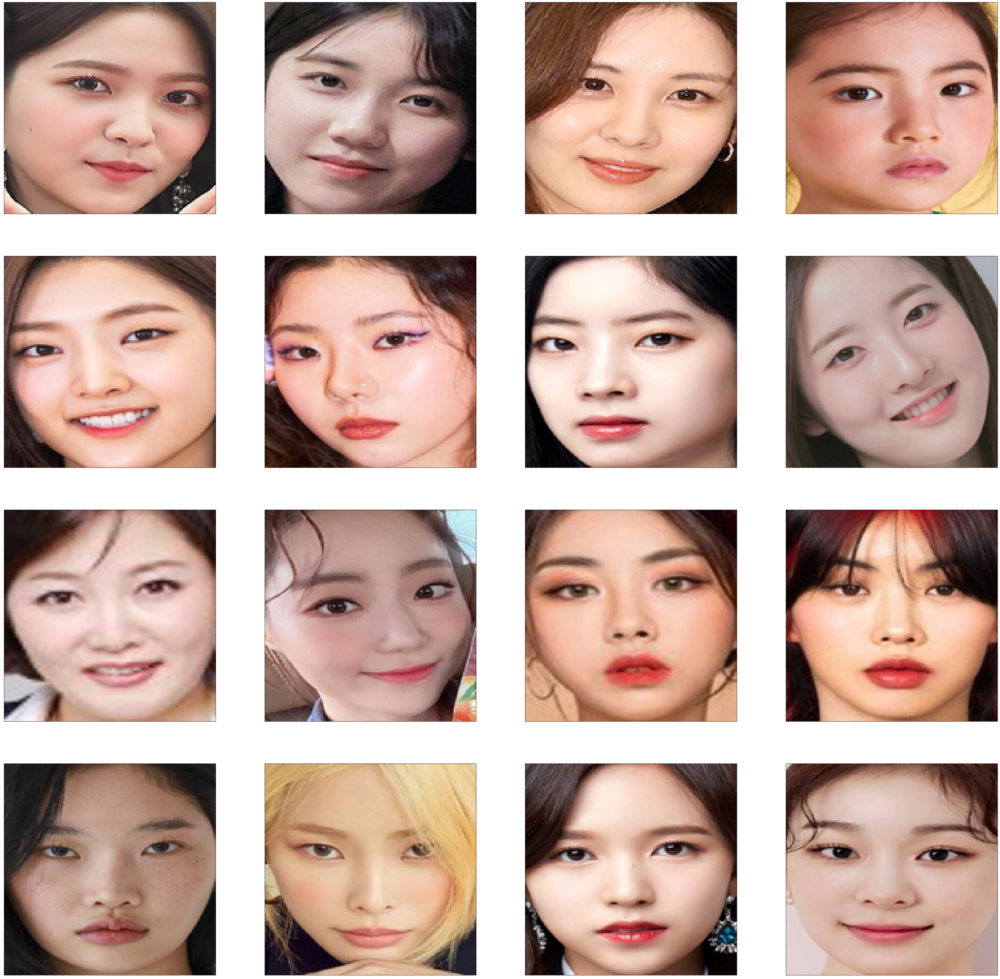

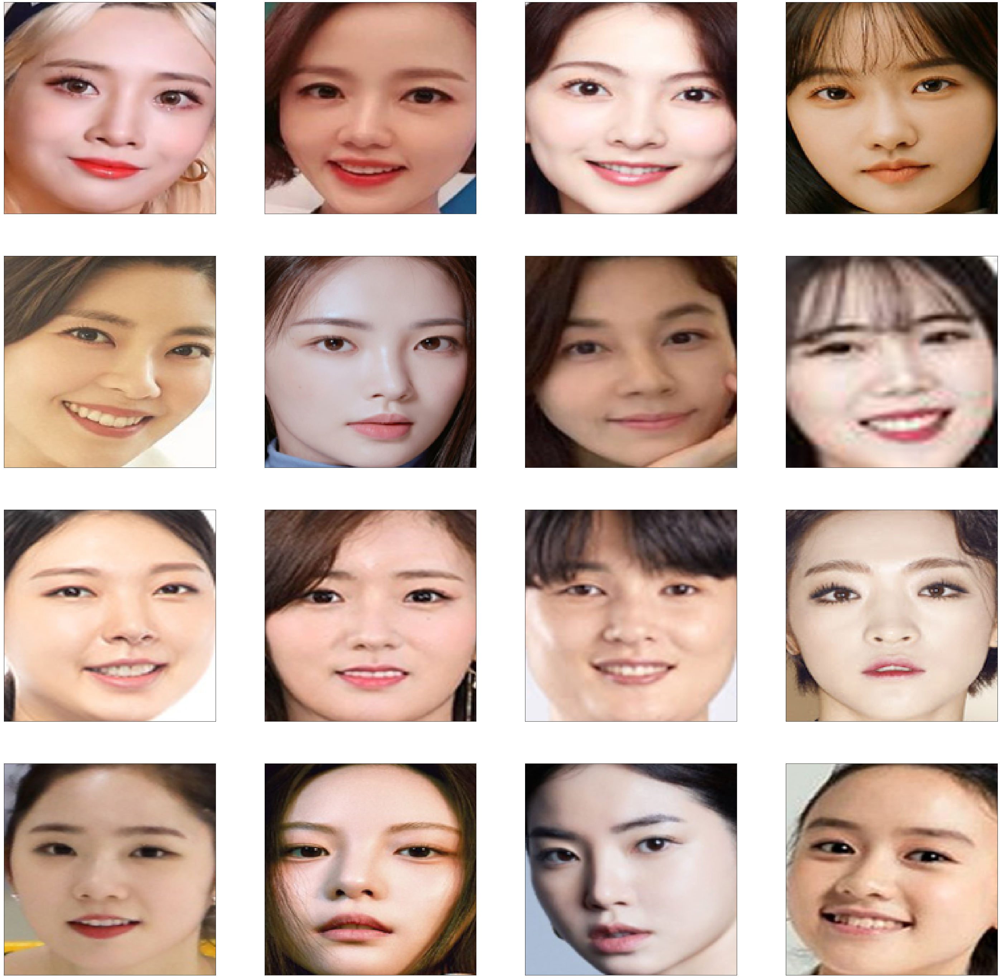

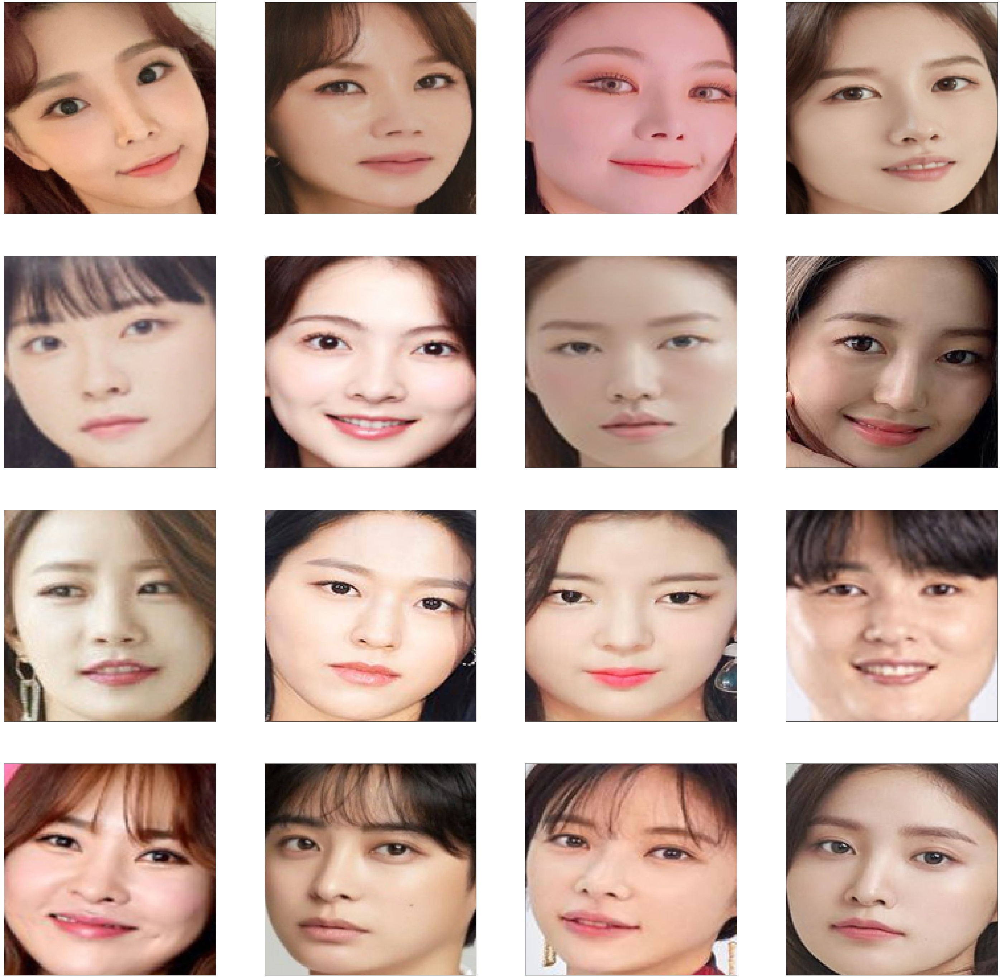

In [ ]:
for i in ['face','eyebrow','eye','nose','lips']:
  n=4
  kmeans=KMeans(n_clusters=4, random_state=0)
  kmeans.fit(scaled_df.loc[:,i].tolist())

  y_pred = kmeans.labels_
  
  for j in range(len(y_pred)):
    pred_df.loc[j,i]=y_pred[j]
  viz_img(y_pred, n)

# 토너먼트

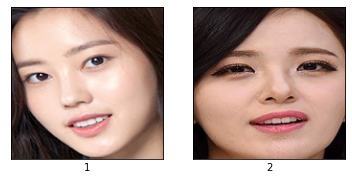

1


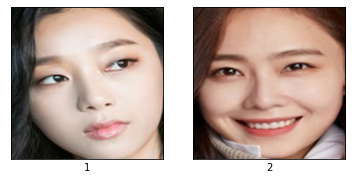

1


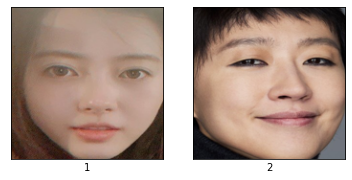

1


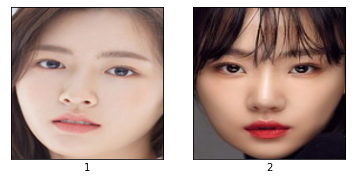

1


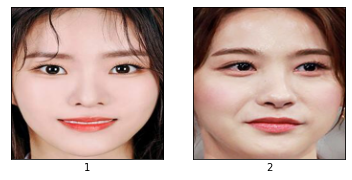

1


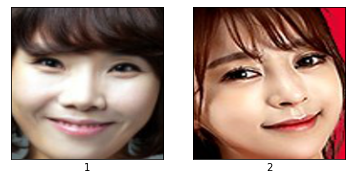

1
1


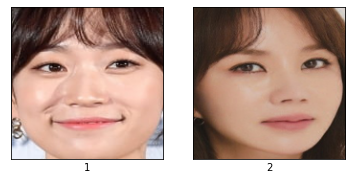

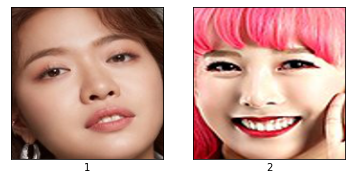

1
1


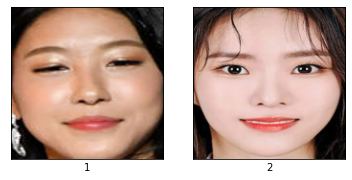

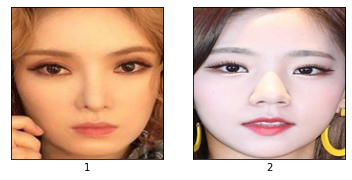

1


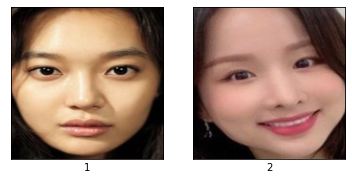

1
1


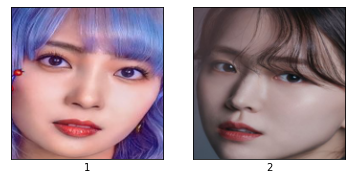

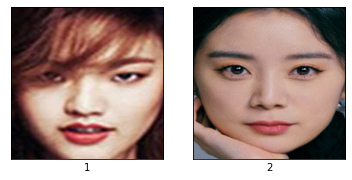

1
1


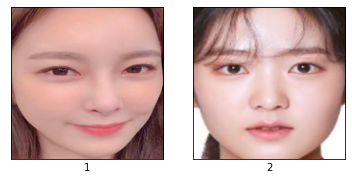

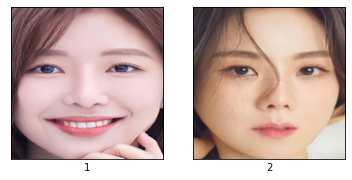

1
1


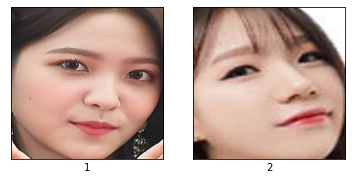

1


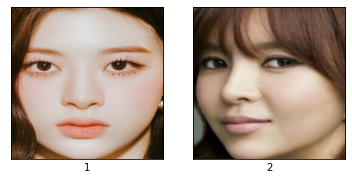

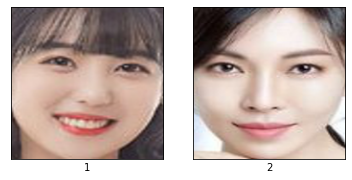

1
1


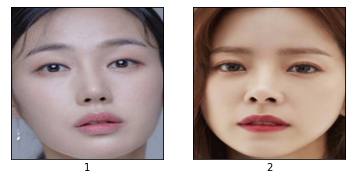

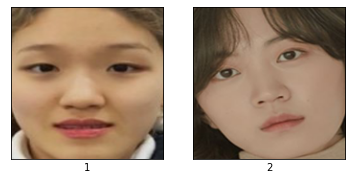

1


In [ ]:
def Knock_out_stage_noiter(data, arr):
    ch_pred = []
    kmeans = KMeans(init="k-means++", n_clusters=10, random_state=0)
    kmeans.fit(arr)
    y_pred = kmeans.labels_
    for i in range(20):
      first, second = np.random.choice(np.unique(y_pred),2) # y_pred 서로 다른 값 뽑기
      f_target = np.random.choice(np.where(first==y_pred)[0].tolist(), 1)[0] # first y_pred에 일치하는 y_pred 값을 가진 데이터 하나 뽑기
      s_target = np.random.choice(np.where(second==y_pred)[0].tolist(), 1)[0] # 위와 동일

      fig = plt.figure()

      ax = fig.add_subplot(1, 2, 1)
      plt.imshow(data[f_target])
      ax.axes.xaxis.set_ticks([])
      ax.get_yaxis().set_visible(False)
      ax.set_xlabel('1')
      
      ax = fig.add_subplot(1,2,2)
      plt.imshow(data[s_target])
      ax.axes.xaxis.set_ticks([])
      ax.get_yaxis().set_visible(False)
      ax.set_xlabel('2')

      plt.show()

      #ch =  input('더 이상형에 가까운 사람을 고르세요. : ')
      ch=input()
      if int(ch)==1:
        ch_pred.append(first)
      elif int(ch)==2:
        ch_pred.append(second)
      else:
        print("Error")    
    return max(set(ch_pred), key=ch_pred.count)
a = Knock_out_stage_noiter(female_data, female_embeddings)

615 615


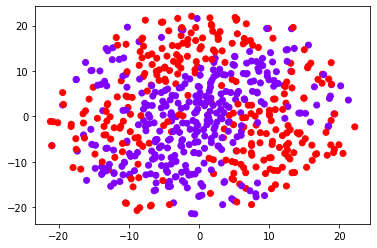

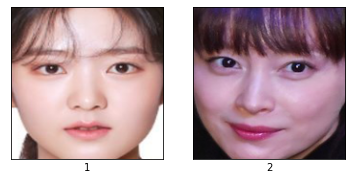

1


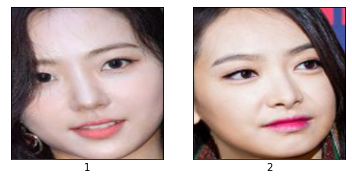

1


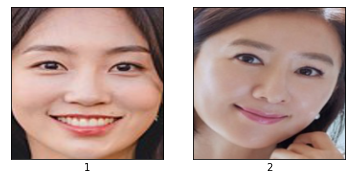

1


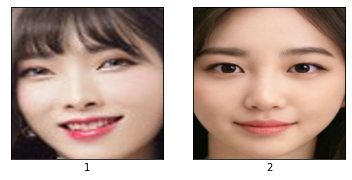

2


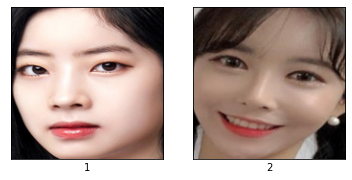

1
331 331


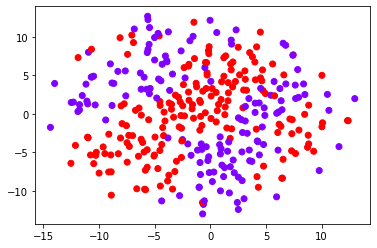

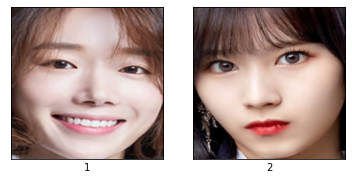

2


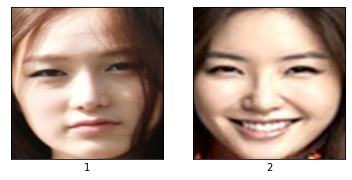

2


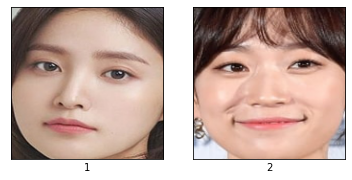

1


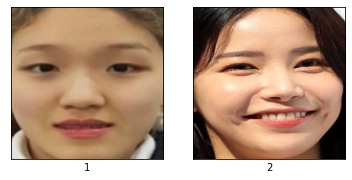

2


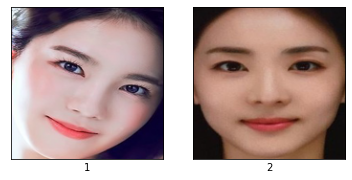

1
183 183


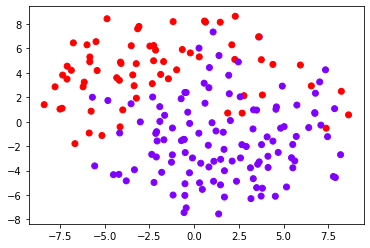

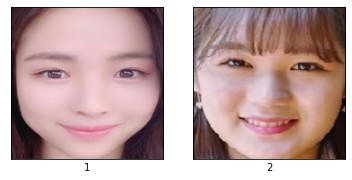

1


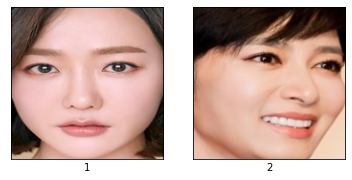

1


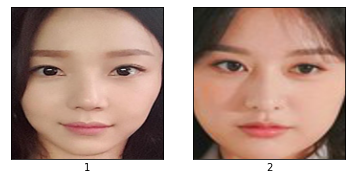

1


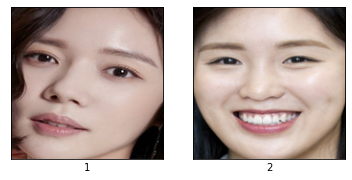

1


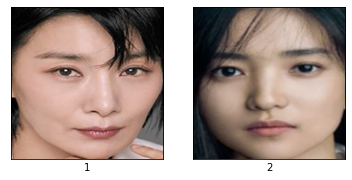

2
118 118


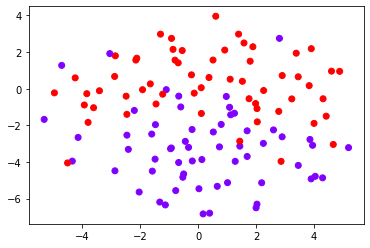

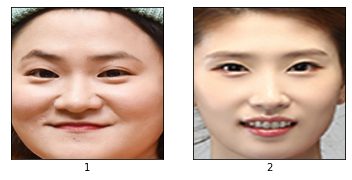

2


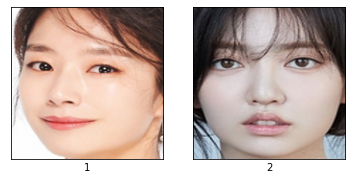

2


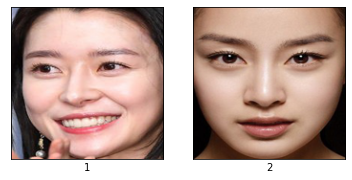

2


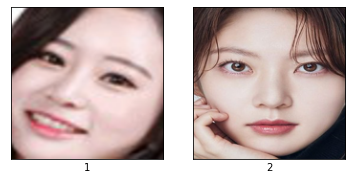

2


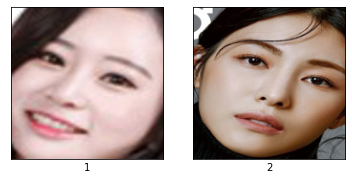

2
60 60


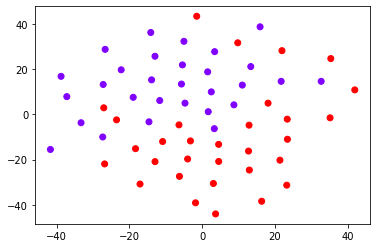

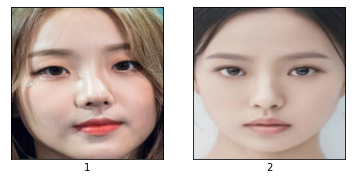

2


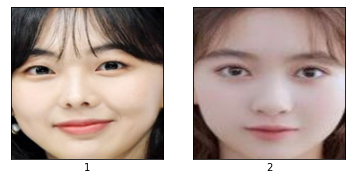

2


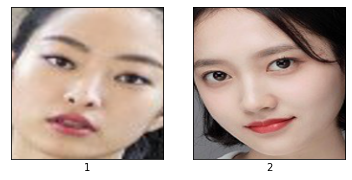

2


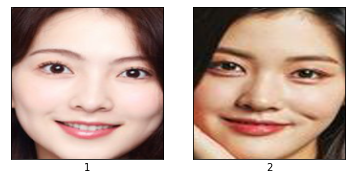

2


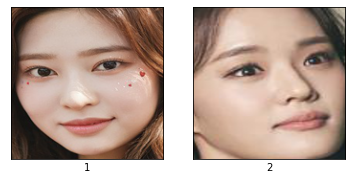

1
29 29


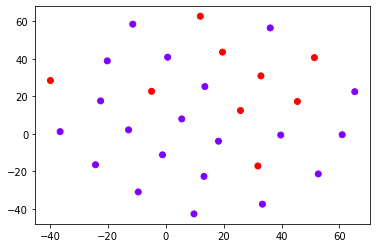

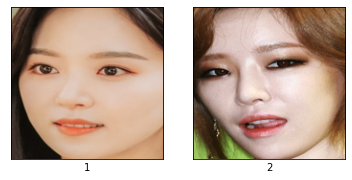

1


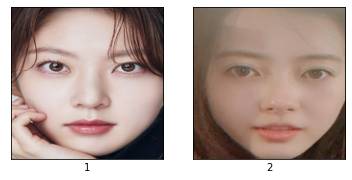

1


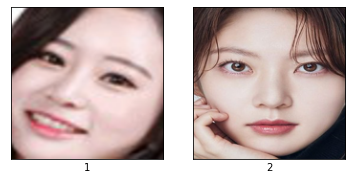

2


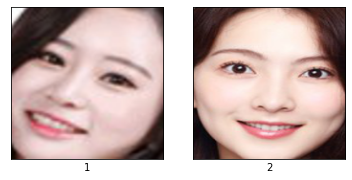

1


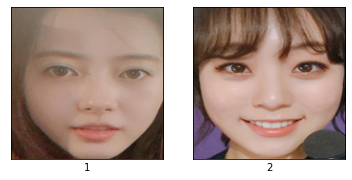

1
20 20


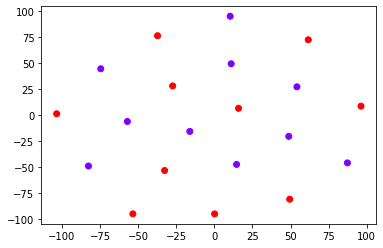

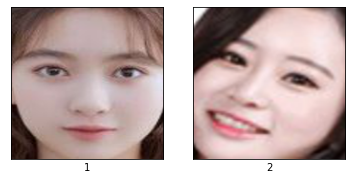

1


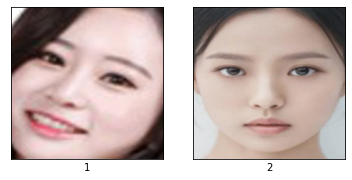

2


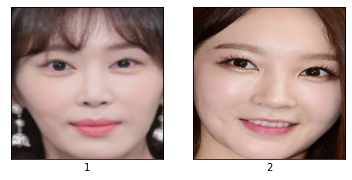

2


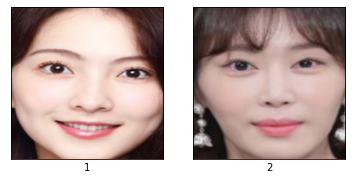

1


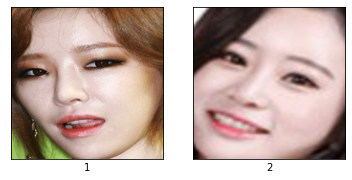

2


ValueError: ignored

In [ ]:
def Knock_out_stage_iter(data, arr):
    d = data.copy()
    a = arr.copy()
    ch_pred = []
    while len(d)>10:
      print(len(d), len(a))
      kmeans = KMeans(init="k-means++", n_clusters=2, random_state=0)
      kmeans.fit(np.array(a))
      y_pred = kmeans.labels_
      tSNE(a,y_pred)
      for i in range(5):
        first, second = np.random.choice(np.unique(y_pred),2) # y_pred 서로 다른 값 뽑기
        f_target = np.random.choice(np.where(first==y_pred)[0].tolist(), 1)[0] # first y_pred에 일치하는 y_pred 값을 가진 데이터 하나 뽑기
        s_target = np.random.choice(np.where(second==y_pred)[0].tolist(), 1)[0] # 위와 동일

        fig = plt.figure()

        ax = fig.add_subplot(1, 2, 1)
        plt.imshow(data[f_target])
        ax.axes.xaxis.set_ticks([])
        ax.get_yaxis().set_visible(False)
        ax.set_xlabel('1')
        
        ax = fig.add_subplot(1,2,2)
        plt.imshow(data[s_target])
        ax.axes.xaxis.set_ticks([])
        ax.get_yaxis().set_visible(False)
        ax.set_xlabel('2')

        plt.show()

        #ch =  input('더 이상형에 가까운 사람을 고르세요. : ')
        ch=input()
        if int(ch)==1:
          ch_pred.append(first)
        elif int(ch)==2:
          ch_pred.append(second)
        else:
          print("Error")  
      d=np.delete(d, np.where(y_pred==max(zip(ch_pred),key=ch_pred.count)),axis=0)
      a=np.delete(a, np.where(y_pred==max(zip(ch_pred),key=ch_pred.count)),axis=0)
    for i in range(len(d)):
      plt.show(d[i])

Knock_out_stage_iter(female_data, female_embeddings)

# Clustering 반복

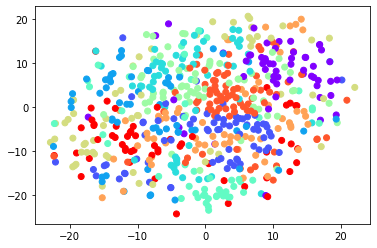

In [ ]:
from sklearn.cluster import KMeans
# cluster 개수 지정
n = 10
# k-means++ : 가지고 있는 데이터 포인트 중에서 무작위로 1개를 선택하여 그 녀석을 첫번째 중심점으로 지정
# 근데 사실 init = 'k-means++'라고 안해줘도 기본값으로 되어있다고 함 
kmeans = KMeans(init="k-means++", n_clusters=n, random_state=0)
# female으로 할지 male로 돌릴지 정해주기
kmeans.fit(female_embeddings)
y_pred = kmeans.labels_

tSNE(female_embeddings, y_pred)

In [ ]:
len()

58

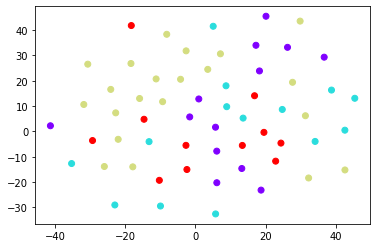

In [ ]:
kmeans_2 = KMeans(n_clusters = 4, random_state=0)
kmeans_2.fit(female_embeddings[np.where(y_pred==2) and np.where(y_pred==3)])

y_pred_2 = kmeans_2.labels_

tSNE(female_embeddings[np.where(y_pred==2) and np.where(y_pred==3)], y_pred_2)